# Hundebestände der Stadt Zürich, neu ab DWH, seit 2015

https://data.stadt-zuerich.ch/dataset/sid_stapo_hundebestand_od1001

https://data.integ.stadt-zuerich.ch/dataset/int_dwh_sid_stapo_hundebestand_od1001

**Beschreibung**
In diesem Datensatz finden Sie Angaben zu Hunden und deren Besitzerinnen und Besitzern aus den Beständen des städtischen Hunderegisters seit 2015. Bei den hundehaltenden Personen sind Informationen zur Altersgruppe, dem Geschlecht und dem statistischen Quartier des Wohnorts angegeben. Zu jedem Hund ist die Rasse, der Rassetyp, das Geschlecht, das Geburtsjahr, das Alter und die Farbe erfasst. Das Hunderegister wird von der Abteilung Hundekontrolle der Stadtpolizei Zürich geführt.

Datum: 26.09.2022


### Importiere die notwendigen Packages

In [5]:
#%pip install geopandas altair fiona requests folium mplleaflet contextily seaborn datetime plotly leafmap

In [6]:
import pandas as pd
import pivottablejs
from pivottablejs import pivot_ui
import numpy as np
import altair as alt
import matplotlib.pyplot as plt

import datetime
import geopandas as gpd
import folium 
import plotly.express as px
import seaborn as sns
import leafmap

import requests
import io

import plotly.express as px


Definiere Settings. Hier das Zahlenformat von Float-Werten (z.B. *'{:,.2f}'.format* mit Komma als Tausenderzeichen), 

In [7]:
#pd.options.display.float_format = lambda x : '{:,.1f}'.format(x) if (np.isnan(x) | np.isinf(x)) else '{:,.0f}'.format(x) if int(x) == x else '{:,.1f}'.format(x)
pd.options.display.float_format = '{:.0f}'.format
pd.set_option('display.width', 100)
pd.set_option('display.max_columns', 15)

### Zeitvariabeln
Bestimme den aktuellst geladenen Monat. Hier ist es der Stand vor 2 Monaten. 
Bestimme noch weitere evt. sinnvolle Zeitvariabeln.

Zum Unterschied zwischen import datetime und from datedtime import datetime, siehe https://stackoverflow.com/questions/15707532/import-datetime-v-s-from-datetime-import-datetime

Zuerst die Zeitvariabeln als Strings

In [8]:
#today_date = datetime.date.today()
#date_time = datetime.datetime.strptime(date_time_string, '%Y-%m-%d %H:%M')
now = datetime.date.today()
date_today = now.strftime("%Y-%m-%d")
year_today = now.strftime("%Y")
month_today = now.strftime("%m")
day_today = now.strftime("%d")

date_day_a_week_ago = (datetime.datetime.now() - datetime.timedelta(days=7)).date()
day_a_week_ago = date_day_a_week_ago.strftime('%Y-%m-%d')


Und hier noch die Zeitvariabeln als Integers:
- `aktuellesJahr`
- `aktuellerMonat`: Der gerade jetzt aktuelle Monat
- `selectedMonat`: Der aktuellste Monat in den Daten. In der Regel zwei Monate her.

In [9]:
#now = datetime.now() 
int_times = now.timetuple()

aktuellesJahr = int_times[0]
aktuellerMonat = int_times[1]
selectedMonat = int_times[1]-2

print(aktuellesJahr, 
      aktuellerMonat,
    'datenstand: ', selectedMonat,
     int_times)


2022 9 datenstand:  7 time.struct_time(tm_year=2022, tm_mon=9, tm_mday=29, tm_hour=0, tm_min=0, tm_sec=0, tm_wday=3, tm_yday=272, tm_isdst=-1)


Berechne die Variable Epoche um später das SAS-Datum in ein Unix-Datum umzuwandeln. Bei SAS beginnt die Epoche am 1.1.1960. Bei Unix am 1.1.1970.
Diese Variable wird beim CSV-Import benötigt.

In [10]:
epoch = datetime.datetime(1960, 1, 1)

### Setze einige Pfadvariabeln

- Der Packagename ist eigentlich der **Verzeichnisname** unter dem die Daten und Metadaten auf der Dropzone abgelegt werden.
- Definiert wird er bei SASA-Prozessen auf dem **Produkte-Sharepoint ([Link](https://kollaboration.intranet.stzh.ch/orga/ssz-produkte/Lists/SASA_Outputs/PersonalViews.aspx?PageView=Personal&ShowWebPart={6087A3E7-8AC8-40BA-8278-DECFACE124FF}))**.
- Der Packagename wird auf CKAN teil der URL, daher ist die exakte Schreibweise wichtig.

Beachte: im Packagename müssen alle Buchstaben **klein** geschrieben werden. Dies weil CKAN aus grossen kleine Buchstaben macht.

**BITTE HIER ANPASSEN**

In [11]:
package_name = "sid_stapo_hundebestand_od1001"

In [12]:
dataset_name = "KUL100OD1001.csv"

**Statische Pfade in DWH-Dropzones**

In [13]:
dropzone_path_integ = r"\\szh\ssz\applikationen\OGD_Dropzone\INT_DWH"

In [14]:
dropzone_path_prod = r"\\szh\ssz\applikationen\OGD_Dropzone\DWH"

**Statische Pfade CKAN-URLs**

In [15]:
ckan_integ_url ="https://data.integ.stadt-zuerich.ch/dataset/int_dwh_"

In [16]:
ckan_prod_url ="https://data.stadt-zuerich.ch/dataset/"

### Checke die Metadaten auf der CKAN INTEG- oder PROD-Webseite

Offenbar lassen sich aktuell im Markdownteil keine Variabeln ausführen, daher gehen wir wie unten gezeigt vor. Siehe dazu: https://data-dive.com/jupyterlab-markdown-cells-include-variables
Instead of setting the cell to Markdown, create Markdown from withnin a code cell! We can just use python variable replacement syntax to make the text dynamic

In [17]:
from IPython.display import Markdown as md

In [18]:
md(" **1. Dataset auf INTEG-Datakatalog:** Link {} ".format(ckan_integ_url+package_name))

 **1. Dataset auf INTEG-Datakatalog:** Link https://data.integ.stadt-zuerich.ch/dataset/int_dwh_sid_stapo_hundebestand_od1001 

In [19]:
md(" **2. Dataset auf PROD-Datakatalog:** Link {} ".format(ckan_prod_url+package_name))

 **2. Dataset auf PROD-Datakatalog:** Link https://data.stadt-zuerich.ch/dataset/sid_stapo_hundebestand_od1001 

### Importiere einen Datensatz 

Definiere zuerst folgende Werte:
1) Kommt der Datensatz von PROD oder INTEG?
2) Beziehst Du den Datensatz direkt ab der DROPZONE oder aus dem INTERNET?

In [23]:
#Die Datasets sind nur zum Testen auf INT-DWH-Dropzone. Wenn der Test vorbei ist, sind sie auf PROD. 
# Über den Status kann man einfach switchen

status = "prod"; #prod vs something else
data_source = "web"; #dropzone vs something else
print(status+" - "+ data_source)

prod - web


In [24]:
# Filepath
if status == "prod":
    if data_source == "dropzone":
            fp = dropzone_path_prod+"\\"+ package_name +"\\"+dataset_name
            print("fp lautet:"+fp)
    else:
        #fp = r"https://data.stadt-zuerich.ch/dataset/bau_neubau_whg_bausm_rinh_geb_projstatus_quartier_seit2009_od5011/download/BAU501OD5011.csv"
        fp = ckan_prod_url+package_name+'/download/'+dataset_name
        print("fp lautet:"+fp)
else:
    if data_source == "dropzone":
        fp = dropzone_path_integ+"\\"+ package_name +"\\"+dataset_name
        print("fp lautet:"+fp)
    else:
        #fp = r"https://data.stadt-zuerich.ch/dataset/bau_neubau_whg_bausm_rinh_geb_projstatus_quartier_seit2009_od5011/download/BAU501OD5011.csv"
        fp = ckan_integ_url+package_name+'/download/'+dataset_name
        print("fp lautet:"+fp)


fp lautet:https://data.stadt-zuerich.ch/dataset/sid_stapo_hundebestand_od1001/download/KUL100OD1001.csv


Beachte, wie das SAS Datum (ohne Format) in ein UNIX Datum umgerechnet und als Datumsformat dargestellt wird! Siehe dazu `https://stackoverflow.com/questions/26923564/convert-sas-numeric-to-python-datetime`

In [25]:
# Read the data

if data_source == "dropzone":
    data2betested = pd.read_csv(
        fp
        , sep=','
        ,parse_dates=['StichtagDatJahr']
        ,low_memory=False
    )
    print("dropzone")
else:
    r = requests.get(fp, verify=False)  
    r.encoding = 'utf-8'
    data2betested = pd.read_csv(
        io.StringIO(r.text)
        ,parse_dates=['StichtagDatJahr']
        # KONVERTIERE DAS SAS DATUM IN EIN UNIXDATUM UND FORMATIERE ES
        #, date_parser=lambda s: epoch + datetime.timedelta(days=int(s))
        , sep=','        
        ,low_memory=False)
    print("web")

data2betested.dtypes

web


StichtagDatJahr       datetime64[ns]
HalterId                       int64
AlterV10Cd                     int64
AlterV10Lang                  object
AlterV10Sort                   int64
SexCd                          int64
SexLang                       object
SexSort                        int64
KreisCd                        int64
KreisLang                     object
KreisSort                      int64
QuarCd                         int64
QuarLang                      object
QuarSort                       int64
Rasse1Text                    object
Rasse2Text                    object
RasseMischlingCd               int64
RasseMischlingLang            object
RasseMischlingSort             int64
RassentypCd                   object
RassentypLang                 object
RassentypSort                  int64
GebDatHundJahr                 int64
AlterVHundCd                   int64
AlterVHundLang                object
AlterVHundSort                 int64
SexHundCd                      int64
S

In [26]:
#data2betested

Berechne weitere Attribute falls notwendig

### Einfache Datentests

 - 1) Zeige eine kurze Vorschau der importierten Daten
 - 2) Weise die Datentypen aus
 - 3) Zeige die Shape (Umfang) des Datensatzes an

In [27]:
#data2betested.head(6)

In [28]:
#data2betested.dtypes

In [29]:
data2betested.shape

(61472, 31)

Beschreibe einzelne Attribute

In [30]:
data2betested.describe()

,HalterId,AlterV10Cd,AlterV10Sort,SexCd,SexSort,KreisCd,KreisSort,...,RassentypSort,GebDatHundJahr,AlterVHundCd,AlterVHundSort,SexHundCd,SexHundSort,AnzHunde
count,61472,61472,61472,61472,61472,61472,61472,...,61472,61472,61472,61472,61472,61472,61472
mean,113861,48,6,2,2,7,7,...,1,2013,6,6,2,2,1
std,25806,59,6,0,0,3,3,...,0,91,12,12,0,0,0
min,126,10,2,1,1,1,1,...,1,1994,0,0,1,1,1
25%,89705,30,4,1,1,4,4,...,1,2008,2,2,1,1,1
50%,116324,40,5,2,2,8,8,...,1,2012,6,6,2,2,1
75%,133157,60,7,2,2,10,10,...,2,2015,9,9,2,2,1
max,160183,999,99,2,2,99,13,...,4,9999,999,999,2,2,3


Wie viele Nullwerte gibt es im Datensatz?

In [31]:
data2betested.isnull().sum()

StichtagDatJahr           0
HalterId                  0
AlterV10Cd                0
AlterV10Lang              0
AlterV10Sort              0
SexCd                     0
SexLang                   0
SexSort                   0
KreisCd                   0
KreisLang                 0
KreisSort                 0
QuarCd                    0
QuarLang                  0
QuarSort                  0
Rasse1Text                0
Rasse2Text            43990
RasseMischlingCd          0
RasseMischlingLang        0
RasseMischlingSort        0
RassentypCd               0
RassentypLang             0
RassentypSort             0
GebDatHundJahr            0
AlterVHundCd              0
AlterVHundLang            0
AlterVHundSort            0
SexHundCd                 0
SexHundLang               0
SexHundSort               0
HundefarbeText            0
AnzHunde                  0
dtype: int64

Welches sind die Angaben ohne Werte bei AnzBestWir?

In [32]:
data2betested[np.isnan(data2betested.AnzHunde)]

,StichtagDatJahr,HalterId,AlterV10Cd,AlterV10Lang,AlterV10Sort,SexCd,SexLang,...,AlterVHundLang,AlterVHundSort,SexHundCd,SexHundLang,SexHundSort,HundefarbeText,AnzHunde


### Verwende das Datum als Index

While we did already parse the `datetime` column into the respective datetime type, it currently is just a regular column. 
**To enable quick and convenient queries and aggregations, we need to turn it into the index of the DataFrame**

In [33]:
data2betested = data2betested.set_index("StichtagDatJahr")

In [34]:
data2betested.loc["2016"].head(1)

,HalterId,AlterV10Cd,AlterV10Lang,AlterV10Sort,SexCd,SexLang,SexSort,...,AlterVHundLang,AlterVHundSort,SexHundCd,SexHundLang,SexHundSort,HundefarbeText,AnzHunde
StichtagDatJahr,,,,,,,,,,,,,,,
2016-01-01,126,60,60- bis 69-Jährige,7,1,männlich,1,...,4-Jährige,4,2,weiblich,2,schwarz/braun,1


### Einfache Visualisierungen zur Plausi

Exploriere die Daten mit Pivottable.JS

In [61]:
from pivottablejs import pivot_ui

pivot_ui(data2betested)

### Zeitpunkte und Zeiträume abfragen

A particular powerful feature of the Pandas DataFrame is its indexing capability that also works using time-based entities, such as dates and times. We have already created the index above, so let's put it to use.

In [35]:
data2betested.columns

Index(['HalterId', 'AlterV10Cd', 'AlterV10Lang', 'AlterV10Sort', 'SexCd', 'SexLang', 'SexSort',
       'KreisCd', 'KreisLang', 'KreisSort', 'QuarCd', 'QuarLang', 'QuarSort', 'Rasse1Text',
       'Rasse2Text', 'RasseMischlingCd', 'RasseMischlingLang', 'RasseMischlingSort', 'RassentypCd',
       'RassentypLang', 'RassentypSort', 'GebDatHundJahr', 'AlterVHundCd', 'AlterVHundLang',
       'AlterVHundSort', 'SexHundCd', 'SexHundLang', 'SexHundSort', 'HundefarbeText', 'AnzHunde'],
      dtype='object')

### Visualisierungen nach Zeitausschnitten

#### Entwicklung Hunde nach Geschlecht und Altersgruppe

In [38]:
myAgg = data2betested.loc[year_today] \
    .groupby(['GebDatHundJahr', 'SexHundLang']) \
    .agg(sum_AnzHunde=('AnzHunde', 'sum')) \
    .sort_values('GebDatHundJahr', ascending=False) 

myAgg.reset_index().head(3)

,GebDatHundJahr,SexHundLang,sum_AnzHunde
0,2022,weiblich,2
1,2022,männlich,3
2,2021,weiblich,470


In [39]:
myTitle="Hundebestand nach Geburtsjahr und Geschlecht, Stand "+year_today


highlight = alt.selection(type='single', on='mouseover',
                          fields=['SexHundLang'], nearest=True)
#x='date:StichtagDatJahr',
base = alt.Chart(myAgg.reset_index().query('GebDatHundJahr < 2023'), title=myTitle).encode(
    x=alt.X('GebDatHundJahr', axis=alt.Axis(title='Jahr'))# , axis=alt.Axis(format='%', title='percentage')
    , y=alt.X('sum_AnzHunde', axis=alt.Axis(title='Anz. Hunde'))
    , color=alt.Color('SexHundLang', legend=alt.Legend(title="Altersgruppen", orient="right"))  
    ,tooltip=['GebDatHundJahr', 'SexHundLang','sum_AnzHunde']    
)
points = base.mark_circle().encode(
    opacity=alt.value(0.75)
).add_selection(
    highlight
).properties(
    width=750 , height=350
)
lines = base.mark_line().encode(
    size=alt.condition(~highlight, alt.value(0.5), alt.value(4))
).interactive()

lines + points

alt.LayerChart(...)

In [40]:
data2betested.reset_index().columns

Index(['StichtagDatJahr', 'HalterId', 'AlterV10Cd', 'AlterV10Lang', 'AlterV10Sort', 'SexCd',
       'SexLang', 'SexSort', 'KreisCd', 'KreisLang', 'KreisSort', 'QuarCd', 'QuarLang', 'QuarSort',
       'Rasse1Text', 'Rasse2Text', 'RasseMischlingCd', 'RasseMischlingLang', 'RasseMischlingSort',
       'RassentypCd', 'RassentypLang', 'RassentypSort', 'GebDatHundJahr', 'AlterVHundCd',
       'AlterVHundLang', 'AlterVHundSort', 'SexHundCd', 'SexHundLang', 'SexHundSort',
       'HundefarbeText', 'AnzHunde'],
      dtype='object')

In [41]:
#myAgg = data2betested.loc["2008-11-30":"2021-10-31"]
myAgg = data2betested.reset_index() \
    .groupby(['StichtagDatJahr','GebDatHundJahr']) \
    .agg(sum_AnzHunde=('AnzHunde', 'sum')) \
    .sort_values('GebDatHundJahr', ascending=False) 

myAgg=myAgg.reset_index().assign(timestamp_str = lambda x: x.StichtagDatJahr.astype(str))
myAgg.reset_index().head(3)

,index,StichtagDatJahr,GebDatHundJahr,sum_AnzHunde,timestamp_str
0,0,2018-01-01,9999,1,2018-01-01
1,1,2015-01-01,9999,3,2015-01-01
2,2,2019-01-01,9999,1,2019-01-01


In [42]:
myTitle="Hundejahresbestände nach Geburtsjahr, seit 2015"


highlight = alt.selection(type='single', on='mouseover',
                          fields=['timestamp_str'], nearest=True)
#x='date:StichtagDatJahr',
base = alt.Chart(myAgg.reset_index().query('GebDatHundJahr < 2023'), title=myTitle).encode(
    x=alt.X('GebDatHundJahr', axis=alt.Axis(title='Geburtsjahre Hunde'))# , axis=alt.Axis(format='%', title='percentage')
    , y=alt.X('sum_AnzHunde', axis=alt.Axis(title='Anz. Hunde'))
    , color=alt.Color('timestamp_str:N', legend=alt.Legend(title="Bestandesjahr", orient="right"))  
    ,tooltip=['GebDatHundJahr', 'timestamp_str','sum_AnzHunde']    
)
points = base.mark_circle().encode(
    opacity=alt.value(0.75)
).add_selection(
    highlight
).properties(
    width=750 , height=350
)
lines = base.mark_line().encode(
    size=alt.condition(~highlight, alt.value(1.5), alt.value(4))
).interactive()

lines + points

alt.LayerChart(...)

#### Barcharts mit Seaborn

In [43]:
#myAgg = data2betested.loc["2008-11-30":"2021-10-31"]
myHist = data2betested.loc[year_today] \
    .groupby(['GebDatHundJahr', 'SexHundLang']) \
    .agg(sum_AnzHunde=('AnzHunde', 'sum')) \
    .sort_values('GebDatHundJahr', ascending=False) 

myHist.reset_index().head(3)

,GebDatHundJahr,SexHundLang,sum_AnzHunde
0,2022,weiblich,2
1,2022,männlich,3
2,2021,weiblich,470


In [44]:
#help(sns.catplot)     

In [45]:
#Stile for the following sns graphs
sns.set_theme(style="whitegrid")

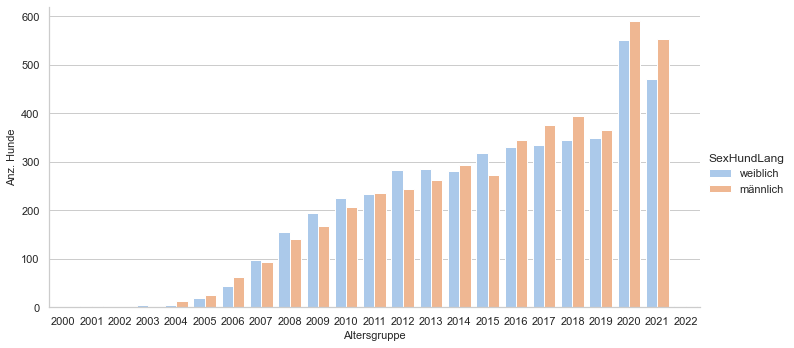

In [46]:
#sns.color_palette("flare", as_cmap=True)
myHist = sns.catplot(x="GebDatHundJahr"
            , y="sum_AnzHunde"
            , hue="SexHundLang"
            , kind="bar" #boxen, violin, --> wenn die aggregation nicht genau den werten in der grafik entspricht
            , palette="pastel" #, color="green"
            , height=5
            , aspect=2
            , order=None, legend_out=True
            ,data=myHist.reset_index().query('GebDatHundJahr < 2023')
           )
myHist.set_xlabels('Altersgruppe', fontsize=11) # not set_label
myHist.set_ylabels('Anz. Hunde', fontsize=11)


In [47]:
data2betested.dtypes

HalterId               int64
AlterV10Cd             int64
AlterV10Lang          object
AlterV10Sort           int64
SexCd                  int64
SexLang               object
SexSort                int64
KreisCd                int64
KreisLang             object
KreisSort              int64
QuarCd                 int64
QuarLang              object
QuarSort               int64
Rasse1Text            object
Rasse2Text            object
RasseMischlingCd       int64
RasseMischlingLang    object
RasseMischlingSort     int64
RassentypCd           object
RassentypLang         object
RassentypSort          int64
GebDatHundJahr         int64
AlterVHundCd           int64
AlterVHundLang        object
AlterVHundSort         int64
SexHundCd              int64
SexHundLang           object
SexHundSort            int64
HundefarbeText        object
AnzHunde               int64
dtype: object

### Hundebestand nach Kreis, Rasse und Geburtsjahr

In [48]:
#myAggBarTop3 = myAgg.reset_index().sort_values(['KreisSort','KreisLang','sum_AnzHunde'], ascending=False).groupby('KreisSort').head(3)
#myAggBarTop3

In [49]:
#myAggBar = data2betested.loc[year_today].query('Rasse1Text =="Chihuahua" or Rasse1Text =="Labrador Retriever" or Rasse1Text =="Yorkshire Terrier"') \
myAggBar = data2betested.query('Rasse1Text =="Chihuahua" or Rasse1Text =="Labrador Retriever" or Rasse1Text =="Yorkshire Terrier"') \
    .groupby(['KreisLang','KreisSort','GebDatHundJahr','Rasse1Text']) \
    .agg(sum_AnzHunde=('AnzHunde', 'sum'), cnt_AnzHalter=('HalterId', 'count')) \
    .sort_values('sum_AnzHunde', ascending=False) 
myAggBar.head()

sum_AnzHunde  cnt_AnzHalter
KreisLang KreisSort GebDatHundJahr Rasse1Text                                     
Kreis 11  11        2013           Chihuahua                    115            115
                    2009           Chihuahua                    111            111
                    2011           Chihuahua                    102            102
Kreis 7   7         2012           Labrador Retriever            98             98
Kreis 11  11        2010           Chihuahua                     91             91

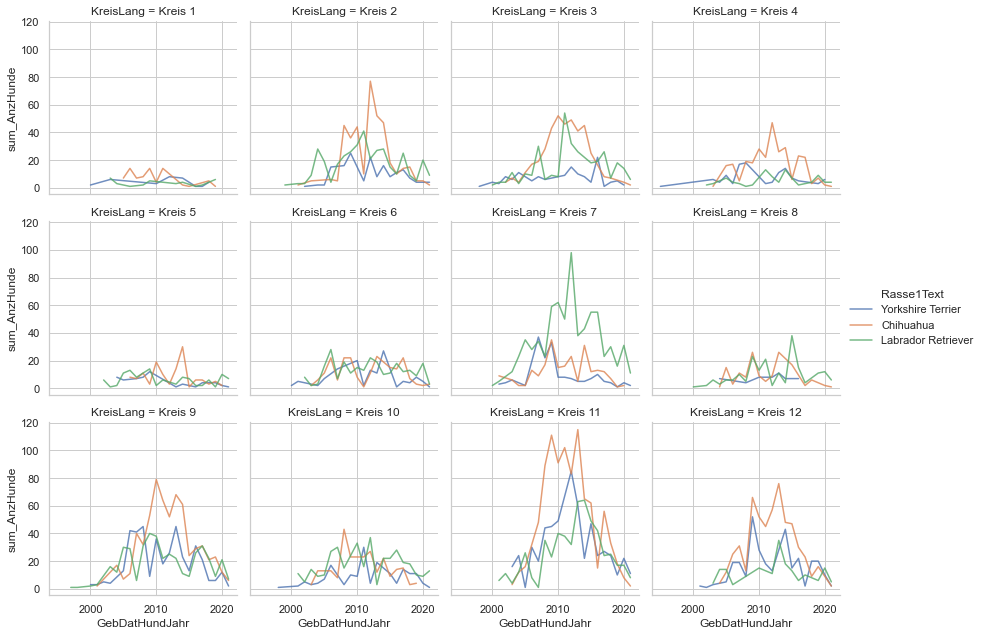

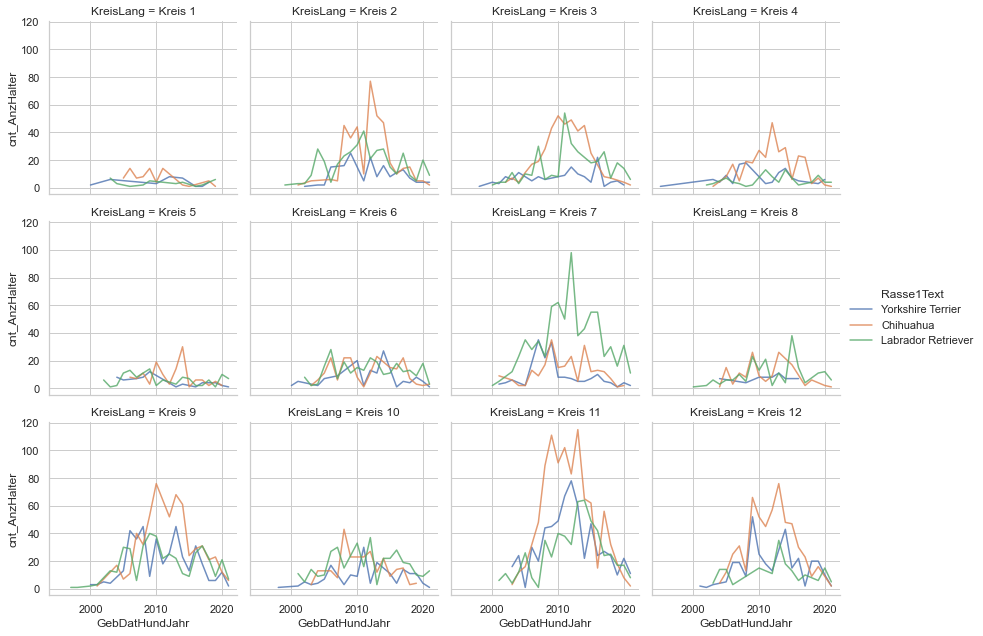

In [50]:
#g = sns.FacetGrid(myAggBar.reset_index(), col="QuarLang", hue="HerkunftLang", col_wrap=6, height=3,)
#g.map(sns.scatterplot, "AlterV05Sort", "sum_WBev", alpha=.8)
#g.add_legend()

g2 = sns.FacetGrid(myAggBar.reset_index().sort_values('KreisSort', ascending=True), col="KreisLang", hue="Rasse1Text", col_wrap=4, height=3,)
g2.map(sns.lineplot, "GebDatHundJahr","sum_AnzHunde",alpha=.8)

g2.add_legend()

g3 = sns.FacetGrid(myAggBar.reset_index().sort_values('KreisSort', ascending=True), col="KreisLang", hue="Rasse1Text", col_wrap=4, height=3,)
g3.map(sns.lineplot, "GebDatHundJahr","cnt_AnzHalter",alpha=.8)

g3.add_legend()

### Daten in interaktiver Treemap zeigen
Dazu gibt es eine sehr nützliche Webseite https://plotly.com/python/treemaps/
Zu Farbskalen, siehe: https://plotly.com/python/builtin-colorscales/

#### Aktueller Hundebestand nach Kreis, Quartier, Geschlecht des Hundes und Rasse

In [51]:
data2betested.columns

Index(['HalterId', 'AlterV10Cd', 'AlterV10Lang', 'AlterV10Sort', 'SexCd', 'SexLang', 'SexSort',
       'KreisCd', 'KreisLang', 'KreisSort', 'QuarCd', 'QuarLang', 'QuarSort', 'Rasse1Text',
       'Rasse2Text', 'RasseMischlingCd', 'RasseMischlingLang', 'RasseMischlingSort', 'RassentypCd',
       'RassentypLang', 'RassentypSort', 'GebDatHundJahr', 'AlterVHundCd', 'AlterVHundLang',
       'AlterVHundSort', 'SexHundCd', 'SexHundLang', 'SexHundSort', 'HundefarbeText', 'AnzHunde'],
      dtype='object')

In [52]:
#data2betested.query('RASSE1 =="Chihuahua" or RASSE1 =="Labrador Retriever" or RASSE1 =="Yorkshire Terrier"') \

myTreemapAgg = data2betested.loc[year_today]  \
    .groupby(['KreisLang', 'KreisSort', 'QuarLang', 'QuarSort', 'Rasse1Text','SexHundLang']) \
    .agg(sum_AnzHunde=('AnzHunde', 'sum'), cnt_AnzHalter=('HalterId', 'count')) \
    .sort_values('sum_AnzHunde', ascending=False) 

myTreemapAgg.reset_index().head(3)

,KreisLang,KreisSort,QuarLang,QuarSort,Rasse1Text,SexHundLang,sum_AnzHunde,cnt_AnzHalter
0,Kreis 10,10,Höngg,101,Unbekannt,weiblich,51,51
1,Kreis 9,9,Altstetten,92,Unbekannt,weiblich,48,48
2,Kreis 9,9,Altstetten,92,Unbekannt,männlich,46,46


In [ ]:
fig = px.treemap(myTreemapAgg.reset_index(), path=[px.Constant("Hundebestand nach Rasse, Stadtquartier und Geschlecht"),'Rasse1Text', 'QuarLang','SexHundLang']
                 , values='sum_AnzHunde'
                 , color='sum_AnzHunde'
                 ## bei discrete scales (bei Klassen und Strings):                 
                 #, color_discrete_map={'(?)':'lightgrey','EVP':'gold', 'SP':'#FF3030', 'PdA':'#EE3B3B', 'Grüne':'#A2CD5A','GLP':'#CAFF70','Die Mitte':'orange','FDP':'#104E8B','AL':'deeppink','SVP':'forestgreen', 'FL ZÜRI':'#8B864E','Volt':'#lightblue' }                
                 ## bei continuous scales (bei Zahlenwerten):
                , color_continuous_scale='Blues'
                #, color_continuous_midpoint=np.average(df['AnzBestWir'], weights=df['AnzBestWir'])  
                 ,height=400
                 ,width=1100                 
                )
fig.update_traces(root_color="grey")
fig.update_layout(margin = dict(t=50, l=25, r=250, b=25))
fig.show()

#### Aktueller Hundebestand nach Kreis, Rasse und Geschlecht

In [46]:
data2betested.columns

Index(['HalterId', 'AlterV10Cd', 'AlterV10Lang', 'AlterV10Sort', 'SexCd', 'SexLang', 'SexSort',
       'KreisCd', 'KreisLang', 'KreisSort', 'QuarCd', 'QuarLang', 'QuarSort', 'Rasse1Text',
       'Rasse2Text', 'RasseMischlingCd', 'RasseMischlingLang', 'RasseMischlingSort', 'RassentypCd',
       'RassentypLang', 'RassentypSort', 'GebDatHundJahr', 'AlterVHundCd', 'AlterVHundLang',
       'AlterVHundSort', 'SexHundCd', 'SexHundLang', 'SexHundSort', 'HundefarbeText', 'AnzHunde'],
      dtype='object')

In [47]:
myTreemapAgg = data2betested.loc[year_today]  \
    .groupby(['KreisCd', 'KreisLang', 'KreisSort','Rasse1Text','SexHundLang']) \
    .agg(sum_AnzHunde=('AnzHunde', 'sum'), cnt_AnzHalter=('HalterId', 'count')) \
    .sort_values('sum_AnzHunde', ascending=False) 

myTreemapAgg.reset_index().head(3)

,KreisCd,KreisLang,KreisSort,Rasse1Text,SexHundLang,sum_AnzHunde,cnt_AnzHalter
0,11,Kreis 11,11,Unbekannt,weiblich,112,112
1,9,Kreis 9,9,Unbekannt,weiblich,92,92
2,7,Kreis 7,7,Unbekannt,weiblich,90,90


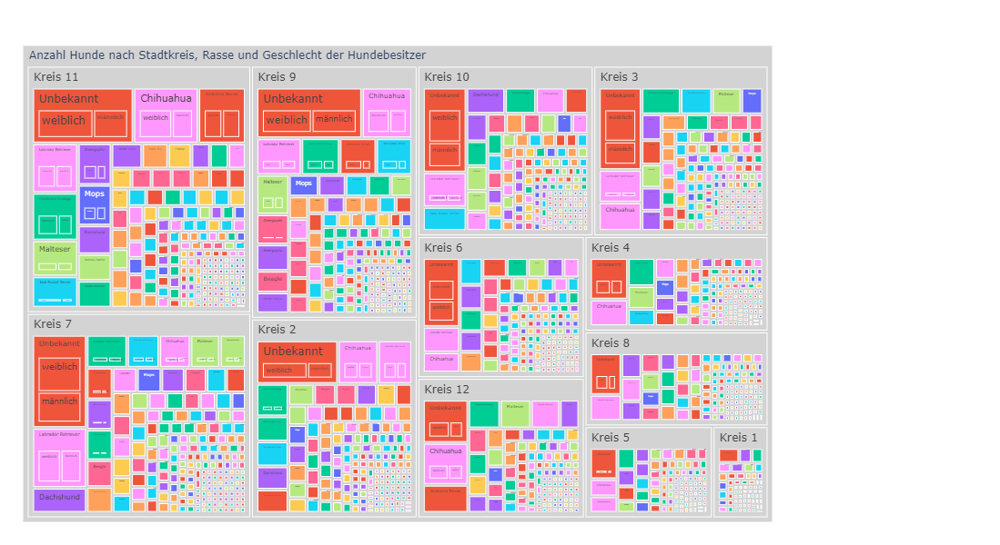

In [48]:
fig = px.treemap(myTreemapAgg.reset_index(), path=[px.Constant("Anzahl Hunde nach Stadtkreis, Rasse und Geschlecht der Hundebesitzer "), 'KreisLang', 'Rasse1Text','SexHundLang']
                 , values='sum_AnzHunde'
                 , color='Rasse1Text'
                 ## bei discrete scales (bei Klassen und Strings):                 
                 #, color_discrete_map={'(?)':'lightgrey','EVP':'gold', 'Ausländer/in':'#FF3030', 'PdA':'#EE3B3B', 'Grüne':'#A2CD5A','GLP':'#CAFF70','Die Mitte':'orange','FDP':'#104E8B','AL':'deeppink','SVP':'forestgreen', 'FL ZÜRI':'#8B864E','Volt':'#lightblue' }                      
                 , color_discrete_map={'(?)':'lightgrey'}                                    
                , color_continuous_scale='blues'
                 ,height=600
                 ,width=1300
                )
fig.update_traces(root_color="grey")
fig.update_layout(margin = dict(t=50, l=25, r=250, b=25))
fig.show()

In [49]:
data2betested.reset_index().columns

Index(['StichtagDatJahr', 'HalterId', 'AlterV10Cd', 'AlterV10Lang', 'AlterV10Sort', 'SexCd',
       'SexLang', 'SexSort', 'KreisCd', 'KreisLang', 'KreisSort', 'QuarCd', 'QuarLang', 'QuarSort',
       'Rasse1Text', 'Rasse2Text', 'RasseMischlingCd', 'RasseMischlingLang', 'RasseMischlingSort',
       'RassentypCd', 'RassentypLang', 'RassentypSort', 'GebDatHundJahr', 'AlterVHundCd',
       'AlterVHundLang', 'AlterVHundSort', 'SexHundCd', 'SexHundLang', 'SexHundSort',
       'HundefarbeText', 'AnzHunde'],
      dtype='object')

#### Alle Hundebestände nach Kreis, Rasse und Geschlecht

In [50]:
myTreemapAgg = data2betested.reset_index() \
    .groupby(['StichtagDatJahr','KreisCd', 'KreisLang', 'KreisSort','Rasse1Text']) \
    .agg(sum_AnzHunde=('AnzHunde', 'sum'), cnt_AnzHalter=('HalterId', 'count')) \
    .sort_values('sum_AnzHunde', ascending=False) 

myTreemapAgg.reset_index().head(3)

,StichtagDatJahr,KreisCd,KreisLang,KreisSort,Rasse1Text,sum_AnzHunde,cnt_AnzHalter
0,2022-01-01,11,Kreis 11,11,Unbekannt,182,182
1,2021-01-01,11,Kreis 11,11,Unbekannt,177,176
2,2022-01-01,9,Kreis 9,9,Unbekannt,175,175


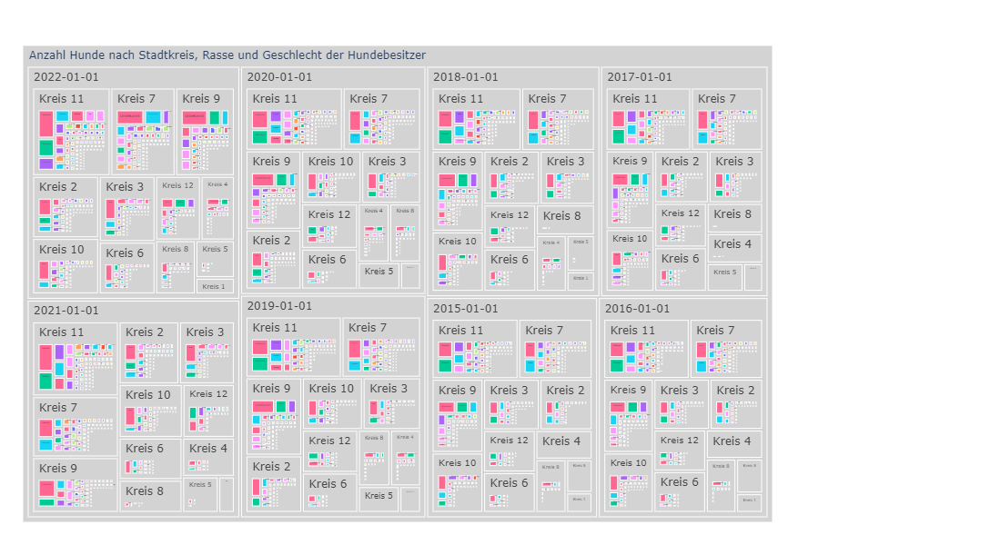

In [51]:
fig = px.treemap(myTreemapAgg.reset_index(), path=[px.Constant("Anzahl Hunde nach Stadtkreis, Rasse und Geschlecht der Hundebesitzer "),'StichtagDatJahr', 'KreisLang', 'Rasse1Text']
                 , values='sum_AnzHunde'
                 , color='Rasse1Text'
                 ## bei discrete scales (bei Klassen und Strings):                 
                 #, color_discrete_map={'(?)':'lightgrey','EVP':'gold', 'Ausländer/in':'#FF3030', 'PdA':'#EE3B3B', 'Grüne':'#A2CD5A','GLP':'#CAFF70','Die Mitte':'orange','FDP':'#104E8B','AL':'deeppink','SVP':'forestgreen', 'FL ZÜRI':'#8B864E','Volt':'#lightblue' }                      
                 , color_discrete_map={'(?)':'lightgrey'}                                    
                , color_continuous_scale='blues'
                 ,height=600
                 ,width=1300
                )
fig.update_traces(root_color="grey")
fig.update_layout(margin = dict(t=50, l=25, r=250, b=25))
fig.show()

## ---------------------- hier Plausi beendet

Liniendiagramm 
[Link zur Doku](https://altair-viz.github.io/gallery/multiline_highlight.html)

### Test: Choroplethenkarte
Importiere die Geodaten als GeoJSON

#### Stadtkreise

In [52]:
# Read abt. Geopandas https://geopandas.org/docs/user_guide/io.html
geojson_url_kreise = "https://www.ogd.stadt-zuerich.ch/wfs/geoportal/Stadtkreise?service=WFS&version=1.1.0&request=GetFeature&outputFormat=GeoJSON&typename=adm_stadtkreise_v"
adm_stadtkreise_v = gpd.read_file(geojson_url_kreise)

adm_stadtkreise_v.head(1)


,id,kname,knr,objid,geometry
0,adm_stadtkreise_v.6,Kreis 7,7,6,"POLYGON ((8.54885 47.36602, 8.54901 47.36601, ..."


#### Statistische Zonen

In [53]:
# Read abt. Geopandas https://geopandas.org/docs/user_guide/io.html
geojson_url_statzonen = "https://www.ogd.stadt-zuerich.ch/wfs/geoportal/Statistische_Zonen?service=WFS&version=1.1.0&request=GetFeature&outputFormat=GeoJSON&typename=adm_statzonen_map"
adm_statzonen_map = gpd.read_file(geojson_url_statzonen)

adm_statzonen_map.head(2)


,id,kname,knr,objectid,objid,qname,qnr,stzname,stznr,geometry
0,adm_statzonen_map.1,Kreis 7,7,1,154,Hirslanden,73,Hegibach,7303,"POLYGON ((8.55670 47.36406, 8.55682 47.36410, ..."
1,adm_statzonen_map.2,Kreis 7,7,2,89,Hirslanden,73,Klus,7302,"POLYGON ((8.57281 47.35806, 8.57278 47.35807, ..."


#### Statistische Quartiere

In [54]:
geojson_url_quartiere = "https://www.ogd.stadt-zuerich.ch/wfs/geoportal/Statistische_Quartiere?service=WFS&version=1.1.0&request=GetFeature&outputFormat=GeoJSON&typename=adm_statistische_quartiere_map"
df_adm_statistische_quartiere_map = gpd.read_file(geojson_url_quartiere)

df_adm_statistische_quartiere_map.head(2)


,id,kname,knr,objectid,objid,qname,qnr,geometry
0,adm_statistische_quartiere_map.1,Kreis 7,7,1,34,Hirslanden,73,"POLYGON ((8.55670 47.36406, 8.55682 47.36410, ..."
1,adm_statistische_quartiere_map.2,Kreis 8,8,2,33,Weinegg,83,"POLYGON ((8.55670 47.36405, 8.55672 47.36403, ..."


### Teste LeafMap

Mehr Infos: https://leafmap.org/leafmap/

In [55]:
m = leafmap.Map()

#m.add_geojson(geojson_url_kreise, layer_name="adm_stadtkreise_v", fill_colors=['red', 'yellow', 'green', 'orange'], info_mode=True)
m.add_gdf(df_adm_statistische_quartiere_map, layer_name='adm_statistische_quartiere_map', style={}, hover_style={}, style_callback=None, fill_colors=['black'], info_mode='on_hover', zoom_to_layer=True)
m.add_gdf(adm_stadtkreise_v, layer_name='adm_stadtkreise_v', style={}, hover_style={}, style_callback=None, fill_colors=['none'], info_mode='on_hover', zoom_to_layer=False)

m.add_legend(title='Legende', legend_dict=None, labels=None, colors=None, position='bottomright', builtin_legend=None, layer_name='adm_statistische_quartiere_map')
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

### Joins
Joine die importierten statistischen Daten des aktuellen Jahres zum Geodatensatz:

*Siehe dazu Doku zu [Geopandas](https://geopandas.org/docs/user_guide/mergingdata.html)*

In [56]:
#data2betested.dtypes
data2betested.head()

,HalterId,AlterV10Cd,AlterV10Lang,AlterV10Sort,SexCd,SexLang,SexSort,...,AlterVHundLang,AlterVHundSort,SexHundCd,SexHundLang,SexHundSort,HundefarbeText,AnzHunde
StichtagDatJahr,,,,,,,,,,,,,,,
2015-01-01,126,60,60- bis 69-Jährige,7,1,männlich,1,...,3-Jährige,3,2,weiblich,2,schwarz/braun,1
2015-01-01,574,60,60- bis 69-Jährige,7,2,weiblich,2,...,12-Jährige,12,2,weiblich,2,brindle,1
2015-01-01,695,40,40- bis 49-Jährige,5,1,männlich,1,...,2-Jährige,2,2,weiblich,2,braun,1
2015-01-01,893,60,60- bis 69-Jährige,7,2,weiblich,2,...,4-Jährige,4,2,weiblich,2,schwarz,1
2015-01-01,1177,50,50- bis 59-Jährige,6,1,männlich,1,...,3-Jährige,3,1,männlich,1,schwarz/weiss,1


In [57]:
myAgg = data2betested.loc["2020"]  \
    .copy() \
    .groupby(['QuarLang', 'QuarCd']) \
    .agg(sum_AnzBestWir=('AnzBestWir', 'sum')) \
    .assign() \
    .sort_values('QuarCd', ascending=False) 

#myAgg.reset_index()


KeyError: "Column(s) ['AnzBestWir'] do not exist"

In [ ]:
# Rename attribute stznr to StatZoneSort, so the IDs have the same name
gdf_adm_statistische_quartiere_map = df_adm_statistische_quartiere_map[['geometry', 'qnr', 'qname', 'knr']].rename(columns={'qnr': 'QuarCd'})
gdf_adm_statistische_quartiere_map.head(1)

#### Leftjoin 
Matche die statistischen Daten mit den Geodaten

In [ ]:
# Merge with `merge` method on shared variable (stznr und StatZoneSort):
gdf_adm_statistische_quartiere_map_joined = gdf_adm_statistische_quartiere_map.merge(myAgg, on='QuarCd', how="left") #'right', 'inner', 'left'
gdf_adm_statistische_quartiere_map_joined.head(2)


In [ ]:
#does all match?
gdf_adm_statistische_quartiere_map_joined.isnull().sum()

In [ ]:
# Plot by StatQuartiere
# Weitere Schemes: scheme='quantiles', scheme='fisherjenks', scheme='natural_breaks',

gdf_adm_statistische_quartiere_map_joined.plot(column='sum_AnzBestWir', cmap='viridis', scheme='natural_breaks', legend=True )
gdf_adm_statistische_quartiere_map_joined.plot(column='sum_AnzBestWir', cmap='viridis', scheme='fisherjenks', legend=True )

#scheme werte: https://matplotlib.org/2.0.2/users/colormaps.html

#
#Neuere Gallerie: https://matplotlib.org/stable/gallery/index.html

In [ ]:
fig, ax = plt.subplots(1, 1)

gdf_adm_statistische_quartiere_map_joined.plot(column='sum_AnzBestWir', ax=ax, legend=True, legend_kwds={'label': "Anzahl WBev 2020",'orientation': "horizontal"})
#gdf_adm_statistische_quartiere_map_joined.plot(column='sum_AnzBestWir', ax=ax, legend=False, legend_kwds={'label': "Anzahl WBev 2020",'orientation': "horizontal"})

#gdf_adm_statistische_quartiere_map_joined.plot(column='sum_Whg_abgebrochen', cmap='viridis', scheme='natural_breaks', legend=True , ax=ax, legend_kwds={'label': "Anzahl Personen",'orientation': "horizontal"})

Noch zu prüfen, folgendes schöne Beispiel: https://docs.bokeh.org/en/latest/docs/user_guide/interaction/legends.html

Konkrete Beispiele von Bookeh in Jupyter NB: https://docs.bokeh.org/en/latest/docs/user_guide/jupyter.html

Noch zu prüfen, folgendes schöne Beispiel: https://docs.bokeh.org/en/latest/docs/user_guide/interaction/legends.html

Konkrete Beispiele von Bookeh in Jupyter NB: https://docs.bokeh.org/en/latest/docs/user_guide/jupyter.html

**Sharepoint als gecheckt markieren!**

Record auf Sharepoint: **[Link](https://kollaboration.intranet.stzh.ch/orga/ssz-produkte/Lists/SASA_Outputs/DispForm.aspx?ID=115&ContentTypeId=0x0100988EAF029F1EFE4CA675F53C32A5D53D01006DBC563E6FBE9E4EB6FDC780799752E1)**